In [1]:
from utils import set_up_logging

set_up_logging()

import torch
from training import HistogramDataset
from visualisation import display_images
from models import load_model
from config import MODELS_PATH, TEST_DATA
from utils import get_device

MODEL = "run_53"
IMAGE_ID = 1

device = get_device()
model, hyperparameters = load_model(MODELS_PATH / MODEL, device)
model.eval()
dataset = HistogramDataset(
    TEST_DATA,
    edit_count=hyperparameters["edit_count"],
    bin_count=hyperparameters["bin_count"],
    target_size=(640, 640),
)

2024-09-05 22:06:52,993 - INFO - Loading model from /home/andras/projects/bipolaroid/saved_models/run_53
2024-09-05 22:06:52,994 - INFO - Hyperparameters: {'batch_size': 128, 'edit_count': 12, 'bin_count': 16, 'learning_rate': 0.002331030431920231, 'scheduler_gamma': 0.8396514875981009, 'num_epochs': 10, 'elu_alpha': 1.5997542544517163, 'leaky_relu_slope': 0.014905901603030717, 'dropout_prob': 0.0445357673555878, 'features': [64, 64, 64], 'use_residual': True, 'kernel_size': 5, 'model_type': 'HistogramNet', 'use_instance_norm': True, 'use_elu': False, 'leaky_relu_alpha': 0.04778301696189257}
2024-09-05 22:06:54,564 - INFO - Parameter count: 5136129
2024-09-05 22:06:54,605 - INFO - Loaded 14719 original images


In [2]:
img = dataset.get_original_image(IMAGE_ID)

edits = {"Original": img}
edits.update(
    {f"Edit {i}": dataset.get_edited_image(IMAGE_ID, edit_idx=i) for i in range(1, 36)}
)

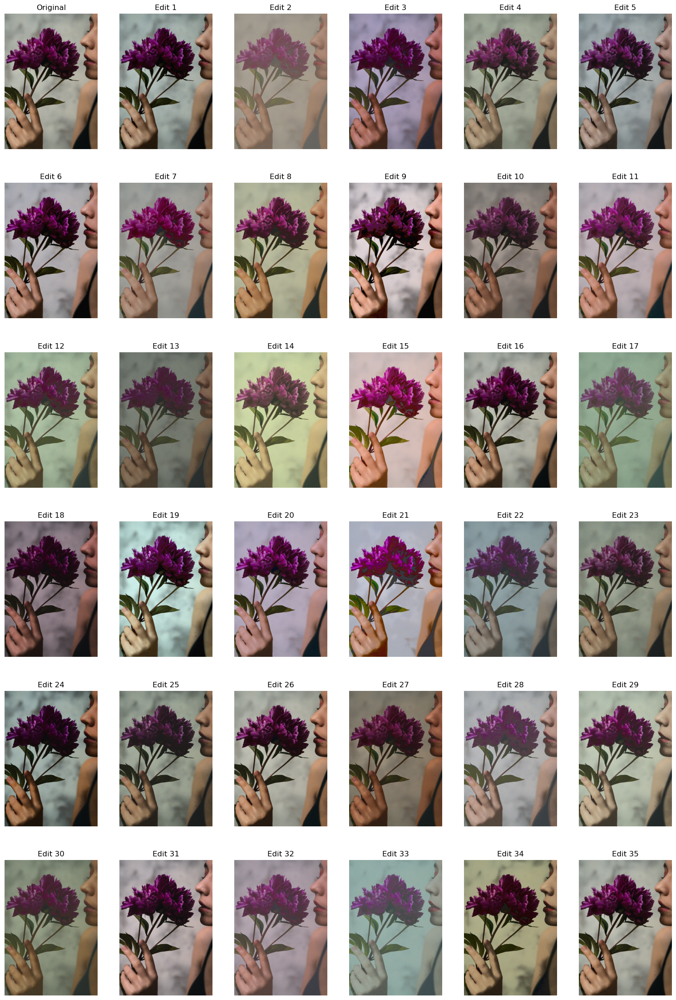

In [3]:
display_images(edits, images_per_row=6, img_size_inches=4)
None

In [4]:
import numpy
from utils import compute_histogram

with torch.no_grad():
    inputs = (
        torch.tensor(
            numpy.array(
                [
                    compute_histogram(
                        image, bins=hyperparameters["bin_count"], normalize=True
                    )
                    for image in edits.values()
                ]
            ),
            dtype=torch.float,
        ).unsqueeze(1)
    ).to(device)

    outputs = model(inputs).to("cpu").detach().numpy().squeeze()

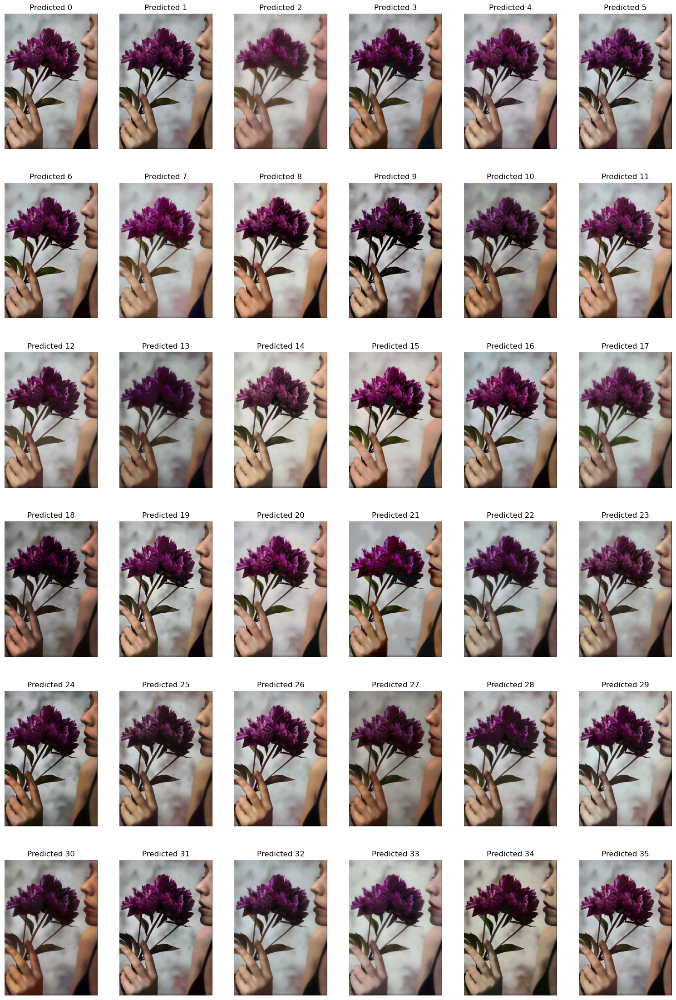

In [5]:
from histogram_transfer import apply_histogram
from PIL import Image
import concurrent.futures


with concurrent.futures.ProcessPoolExecutor() as executor:
    results = list(
        executor.map(
            apply_histogram,
            edits.values(),
            outputs,
        )
    )

predicted = {
    f"Predicted {i}": Image.fromarray(result) for i, result in enumerate(results)
}
display_images(predicted, images_per_row=6, img_size_inches=4)
None